# Images Mini Challange: Classificação de Evento de múltiplas classes

Esse notebook monta um classificador de imagem de mútiplas classes (3)

## 1. Problema

Identificar o evento dado uma foto tirada em uns dos 3 eventos possíveis.

Quando se tem uma galeria de fotos se quer classificá-las por evento.

## 2. Dado

O dado utilizado é fornecido pelo desafio postado no bitbucket por um empresa.

https://bitbucket.org/kognitalab/images_mini_challange/src/master/

A empresa tirou os dados de uma banco de dados disponibilizado por *Multimedia Signal Processing and Understanding Lab da Universidade de Trento, Itália*

## 3. Avaliação

A avaliação é descrita pelo professor como:

* **Parte 2:** Avalie seus resultados gerando uma curva ROC e calculando sua área.

* **Parte 3:** Avalie a robustez do seu resultado redefinindo randomicamente os samples de treinamento e teste pelo menos 10-20 vezes e calculando o desvio padrão e a média da curva.

* **Parte 4:** Avalie o overfitting da sua rede.

* **Parte 5:** Adicione mais um bloco Conv+ReLu+Maxpool e refaça o passo 3. O resultado melhorou ou piorou? Você consegue obter alguma intuição desse resultado?

https://clearnightsrthebest.com/teaching-ensino/

## 4. Características

Algumas informações sobre o dados:

* Como estamos trabalhando com imagens (dados não estruturado) a melhor opção é utilizar Deep Learning.

* Há 3 tipos de eventos possíveis (ou seja, 3 categorias).

* Há 20987 linhas na tabela classificatória, logo há 20987 imagens classificadas. Porém após análise verificou-se que há apenas 11008 imagens.

* O banco de imagens não é divido, logo devemos dividir entre treino e validação. Não há uma banco de imagens de teste.

## Setting Workspace

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import tensorflow_hub as hub
print('TF version:', tf.__version__)
print('TF version:', hub.__version__)
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout
from sklearn.model_selection import train_test_split

# Check for GPU availability
print("GPU", "available \o/" if tf.config.list_physical_devices("GPU") else "not available :(")

TF version: 2.3.0
TF version: 0.9.0
GPU available \o/


## Getting the data ready

Turning images into tensors

In [ ]:
data = pd.read_csv("drive/My Drive/CBPF/Deep Learning/Tarefa 4/dataset_images_minitest.csv", delim_whitespace=True)
data.describe()

,filename,category
count,20987,20987
unique,20987,3
top,11265296644_69ee1f158d.jpg,meeting
freq,1,7000


In [ ]:
data.head()

,filename,category
0,1007270_99118848fd.jpg,graduation
1,1007274_075d925378.jpg,graduation
2,1009219698_b40b9e6d87.jpg,graduation
3,10100422_0feca68bfb.jpg,graduation
4,10100587_48faabb61a.jpg,graduation


In [ ]:
# Check whether number of filenames matches number of actual image files
import os
if len(os.listdir("drive/My Drive/CBPF/Deep Learning/Tarefa 4/data_folder/")) == len(data):
  print("Filenames match actual amount of files!!! Proceed")
else:
  print("Filenames do not match actual amount of files, check the target directory. Diff is:")
  diff = len(os.listdir("drive/My Drive/CBPF/Deep Learning/Tarefa 4/data_folder/")) - len(data)
  print(diff)
  

Filenames do not match actual amount of files, check the target directory. Diff is:
-9979


* The number of elements in data frame doesn't fit the number od images in data_folder.
* So we have to exclude the lines that doesn't have corresponding images

In [ ]:
#for item in data:
import os.path
#os.path.isfile("drive/My Drive/CBPF/Deep Learning/Tarefa 4/data_folder/" + data["filename"][6493])
count = 0
countf = 0
d = data
for i,item in enumerate(data["filename"]):
  if (os.path.isfile("drive/My Drive/CBPF/Deep Learning/Tarefa 4/data_folder/" + item) == False):
    d = d.drop([i])
  #else:
  #  countf = countf + 1

data = d
len(data)

11008

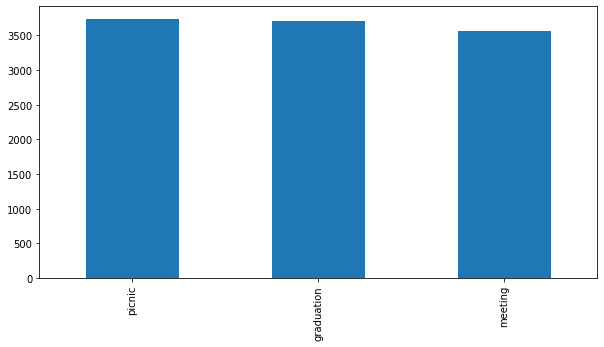

In [ ]:
# How many images are there of each event
data["category"].value_counts().plot.bar(figsize=(10, 5));

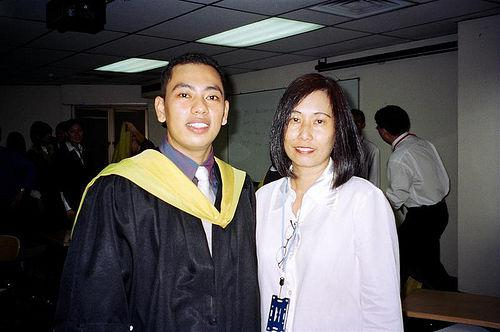

In [ ]:
from IPython.display import Image
Image("drive/My Drive/CBPF/Deep Learning/Tarefa 4/data_folder/" + data["filename"][0])

### Dividing the overall data into data features and its labels and turning into numpy arrays

In [ ]:
filenames = data["filename"].to_numpy()
categories = data["category"].to_numpy()

filenames[:5], categories[:5]

(array(['1007270_99118848fd.jpg', '1007274_075d925378.jpg',
        '1009219698_b40b9e6d87.jpg', '10100422_0feca68bfb.jpg',
        '10100587_48faabb61a.jpg'], dtype=object),
 array(['graduation', 'graduation', 'graduation', 'graduation',
        'graduation'], dtype=object))

### Adding the whole path to images filenames

In [ ]:
filenames_complete_path = ["drive/My Drive/CBPF/Deep Learning/Tarefa 4/data_folder/" + filename for filename in filenames]
filenames = filenames_complete_path
filenames[:5]

['drive/My Drive/CBPF/Deep Learning/Tarefa 4/data_folder/1007270_99118848fd.jpg',
 'drive/My Drive/CBPF/Deep Learning/Tarefa 4/data_folder/1007274_075d925378.jpg',
 'drive/My Drive/CBPF/Deep Learning/Tarefa 4/data_folder/1009219698_b40b9e6d87.jpg',
 'drive/My Drive/CBPF/Deep Learning/Tarefa 4/data_folder/10100422_0feca68bfb.jpg',
 'drive/My Drive/CBPF/Deep Learning/Tarefa 4/data_folder/10100587_48faabb61a.jpg']

### Turning the category values into number values

In [ ]:
# Getting the unique categories
#categories_numpy = categories.to_numpy()
unique_categories = np.unique(categories)
unique_categories

array(['graduation', 'meeting', 'picnic'], dtype=object)

In [ ]:
# Turning every category into a array of booleans
boolean_categories = [category == unique_categories for category in categories]
boolean_categories[:3]

[array([ True, False, False]),
 array([ True, False, False]),
 array([ True, False, False])]

Below is a example of what will happen to each boolean array when turning into a tensor

In [ ]:
# Turning boolean_categories into a array of integers
boolean_categories[0].astype(int)

array([1, 0, 0])

### Creating a training, validation and test data set 

The problem doesn't break the data set into training, validation and test data set. So we have to divide it.

In [ ]:
NUM_IMAGES = 1000 #@param {type: "slider", min:500, max:6900}

In [ ]:
countg = 0
countp = 0
countm = 0
for i in data["category"]:
  if (i == "graduation"):
    countg = countg + 1
  if (i == "picnic"):
    countp = countp + 1
  if (i == "meeting"):
    countm = countm + 1

print(countg)
print(countp)
print(countm)


3709
3731
3568


In [ ]:
len(data)

11008

In [ ]:
# Setting X & y variables

# Getting X & y with not all the data but with all the 3 possibilities
## Intervals: graduation 0:3708 , picnic 3709:7439, meeting 7440:11008
# Images
X_graduation = filenames[0:3708]
X_picnic = filenames[3709:7439]
X_meeting = filenames[7440:11008]
# Categories
y_graduation = boolean_categories[0:3708]
y_picnic = boolean_categories[3709:7439]
y_meeting = boolean_categories[7440:11008]

#X_frames = [X_graduation[:NUM_IMAGES], X_picnic[:NUM_IMAGES], X_meeting[:NUM_IMAGES]]
#y_frames = [y_graduation[:NUM_IMAGES], y_picnic[:NUM_IMAGES], y_meeting[:NUM_IMAGES]]

# Getting NUM_IMAGES images from each category
X = np.concatenate((X_graduation[:NUM_IMAGES], X_picnic[:NUM_IMAGES], 
                           X_meeting[:NUM_IMAGES]))
y = np.concatenate((y_graduation[:NUM_IMAGES], y_picnic[:NUM_IMAGES], 
                           y_meeting[:NUM_IMAGES]))

#X = pd.concat(X_frames)
#y = pd.concat(y_frames)

len(X), len(y)

#data[data["filename"] == "p015_0123.jpg"]
#data["category"][20986]

(3000, 3000)

[False False  True]


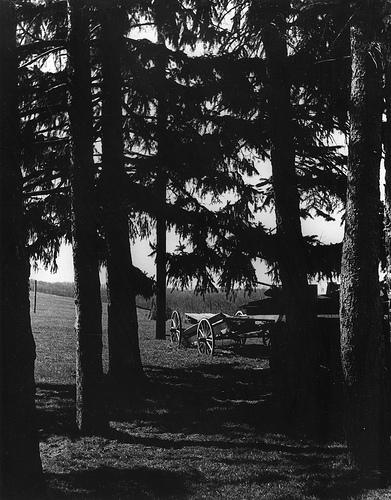

In [ ]:
print(y[1000])
Image(X[1000])

In [ ]:
# Split X & y into training and validation data sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1)
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.2)

len(X_train), len(X_val), len(y_train), len(y_val), len(y_test), len(y_test)

(2160, 540, 2160, 540, 300, 300)

In [ ]:
X_train[:5], y_train[:5]

(array(['drive/My Drive/CBPF/Deep Learning/Tarefa 4/data_folder/13785732834_3a120213b8.jpg',
        'drive/My Drive/CBPF/Deep Learning/Tarefa 4/data_folder/13725069324_66635a15ab.jpg',
        'drive/My Drive/CBPF/Deep Learning/Tarefa 4/data_folder/154935649_4d1dda2020.jpg',
        'drive/My Drive/CBPF/Deep Learning/Tarefa 4/data_folder/13462009753_0394dbe610.jpg',
        'drive/My Drive/CBPF/Deep Learning/Tarefa 4/data_folder/14128539472_5239a92aa7.jpg'],
       dtype='<U81'), array([[ True, False, False],
        [False,  True, False],
        [ True, False, False],
        [False,  True, False],
        [False,  True, False]]))

## Preprocessing Images (turning images into Tensors)

In [ ]:
IMG_SIZE = 224

# Create a function for preprocessing images 
def process_image(image_path, img_size=IMG_SIZE):
  """
  Takes an image file path and turns the image into a tensor.
  """

  # Read image file
  image = tf.io.read_file(image_path)
  # Turn the file into numerical Tensor with 3 colour channels (RGB)
  image = tf.image.decode_jpeg(image, channels=3)
  # Convert the colour channel values from 0-255 to 0-1 values
  image = tf.image.convert_image_dtype(image, tf.float32)
  # Resize the image to our desired value (224, 244)
  image  = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])

  return image

# Turning images and labels into tensors

## Turning data into batches

In [ ]:
# Create a simple function to return a tuple (image, category)
def get_image_category(image_path, category):
  """
  Takes a image file path name and the associated category, 
  processes the image and return a type of (image, category).
  """

  image = process_image(image_path)
  return image, category

In [ ]:
# Demo of the above
(process_image(X[42]), tf.constant(y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.00000000e+00, 7.73004629e-03, 8.22398514e-02],
         [1.18915305e-01, 1.38566926e-01, 2.12945431e-01],
         [4.93587218e-02, 5.67641817e-02, 1.21164866e-01],
         ...,
         [6.11546218e-01, 6.27232492e-01, 6.38997197e-01],
         [6.23485744e-01, 6.39172018e-01, 6.50936723e-01],
         [6.20929599e-01, 6.36615872e-01, 6.43180847e-01]],
 
        [[0.00000000e+00, 1.87559426e-02, 9.21446010e-02],
         [6.64335894e-05, 2.17667810e-04, 7.07183704e-02],
         [4.56072949e-03, 1.37922345e-02, 7.50736967e-02],
         ...,
         [6.11546218e-01, 6.27232492e-01, 6.38997197e-01],
         [6.23485744e-01, 6.39172018e-01, 6.50936723e-01],
         [6.20929599e-01, 6.36615872e-01, 6.48380578e-01]],
 
        [[1.21872807e-02, 1.43931741e-02, 8.49814117e-02],
         [3.56619037e-03, 2.50946358e-02, 8.77521932e-02],
         [0.00000000e+00, 8.64548795e-03, 6.60188273e-02],
         ...,
         [6

Now we've got a wat to turn our data into tuples of Tensors in the form: `(image, category)`, let's make a function to turn all of our data (`X & y`)

In [ ]:
BATCH_SIZE = 32

# Create a function to turn data into batches
def create_data_batches(X, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  """
  Creates batches of data out of image (X) and label (y) pairs.
  Shuffles the data if it's training data but doesn't shuffle if it's validation data.
  Also accepts test data as input (no labels).
  """

  # If the data is a test dataset, we probably don't have labels
  if test_data:
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X))) # only filepaths (no labels)
    data_batch = data.map(process_image).batch(batch_size)
    return data_batch

  # If the data is a valid dataset, we don't need to shuffle it
  elif valid_data:
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),  # filepaths
                                               tf.constant(y))) # labels
    data_batch = data.map(get_image_category).batch(batch_size)
    return data_batch
  
  else:
    print("Creating training data batches...")
    # Turn filepaths and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                               tf.constant(y)))
    
    # Shuffling pathnames and labels before mapping image processor function is faster than shuffling images 
    data = data.shuffle(buffer_size=len(X))

    # Create (image, label) tuples (this also turns the image path into a preprocessed image)
    data = data.map(get_image_category)

    # Turn the training data into batches
    data_batch = data.batch(batch_size)
  return data_batch

In [ ]:
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data=True)

Creating training data batches...
Creating validation data batches...


In [ ]:
# Check the different attributes of our data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 3), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 3), dtype=tf.bool, name=None)))

## Visualizing Data Batches

Our data is now in batches, however, these can be a little hard to understand/comprehend, let's visualize them!

In [ ]:
# Create a function for viewing images in data batch
def show_25_images(images, labels):
  """
  Displays a plot of 25 images and their labels form a data batch.
  """

  # Setup the figure
  plt.figure(figsize=(10, 10))
  # Loop through 25 (for displaying 25 images)
  for i in range(25):
    # Create subplots (5 rows, 5 columns)
    ax = plt.subplot(5, 5, i+1)
    # Displays an image
    plt.imshow(images[i])
    # Add the image label as the title
    plt.title(unique_categories[labels[i].argmax()])
    # Turn the grid lines off
    #plt.axis("off")

In [ ]:
train_data

<BatchDataset shapes: ((None, 224, 224, 3), (None, 3)), types: (tf.float32, tf.bool)>

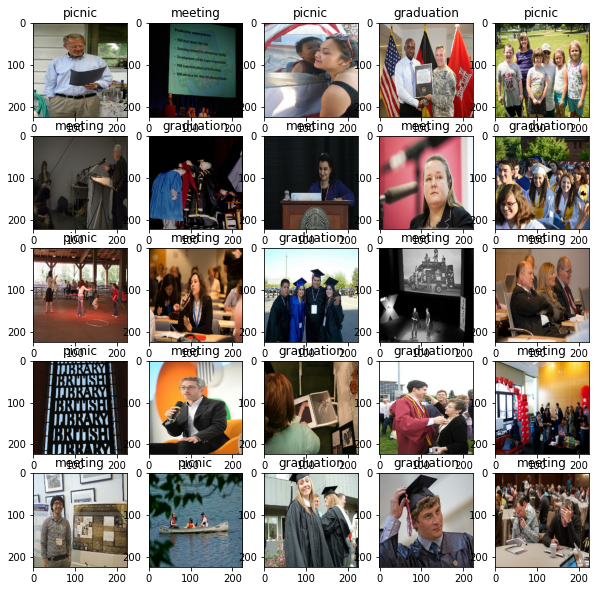

In [ ]:
train_images, train_categories = next(train_data.as_numpy_iterator())
# Now let's visualize the data in a training batch
show_25_images(train_images, train_categories)

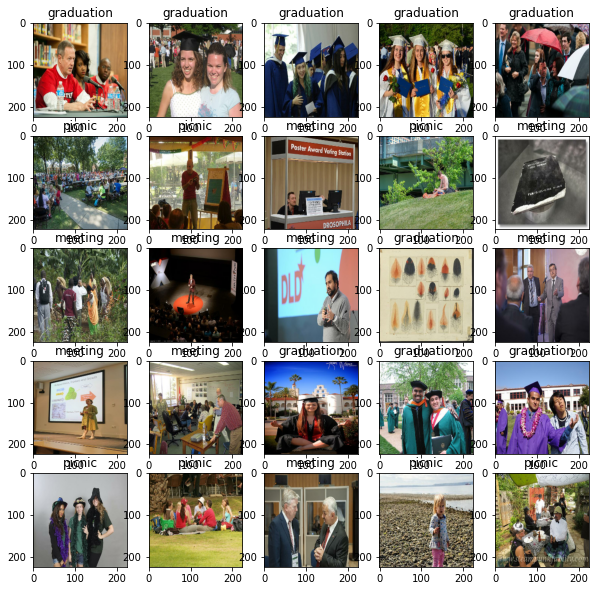

In [ ]:
val_images, val_categories = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_categories)

# Building the Model

In [ ]:
# Setup input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # batch, height, width, colour channels

# Setup output of our model
OUTPUT_SHAPE = len(unique_categories) # 3 (categories)

# known model
# Setup model URL from TensorFlow Hub
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4"

In [ ]:
# first attempt to create a model

# Setup the mode layers
#model = tf.keras.Sequential([
#      tf.keras.layers.Conv2D(32, kernel_size=(5, 5), input_size=INPUT_SIZE, activation='relu'),
#      tf.keras.layers.MaxPooling2D(pool_size=(2, 2)),
#      tf.keras.layers.Conv2D(16, kernel_size=(3, 3), input_size=INPUT_SIZE, activation='relu'),
#      tf.keras.layers.MaxPooling2D(pool_size=(2, 2)),
#      ])

In [ ]:
#Setup the model layers
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print("Building model with:", MODEL_URL)

  model = Sequential()
  model.add(hub.KerasLayer(MODEL_URL))
  #model.add(Dropout(0.3))
  #model.add(Dense(640, activation='softmax'))
  #model.add(Dense(320, activation='softmax'))
  #model.add(Dense(160, activation='softmax'))
  model.add(Dropout(0.2))
  model.add(Dense(OUTPUT_SHAPE, activation='softmax'))

  #model = tf.keras.Sequential([
  #  hub.KerasLayer(MODEL_URL), # Layer 1 (input layer)
  #  tf.keras.layers.Dense(units=OUTPUT_SHAPE,
  #                        activation="softmax") # Layer 2 (output layer)
  #])

  # Compile the model
  model.compile(
      loss = 'categorical_crossentropy',
      optimizer = 'adam',
      metrics=["accuracy"]
  )

  # Build the model
  model.build(INPUT_SHAPE)

  return model

In [ ]:
model = create_model()
model.summary()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
keras_layer (KerasLayer)     (None, 1001)              5432713   
_________________________________________________________________
dropout (Dropout)            (None, 1001)              0         
_________________________________________________________________
dense (Dense)                (None, 3)                 3006      
Total params: 5,435,719
Trainable params: 3,006
Non-trainable params: 5,432,713
_________________________________________________________________


## Creating callbacks

### TensorBoard Callback

In [ ]:
# Load TensorBoard notebook extension
%load_ext tensorboard

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


In [ ]:
import datetime
import os

# Create a function to build a TensorBoard callback
def create_tensorboard_callback():
  # Create a log directory for storing TensorBoard logs
  logdir = os.path.join("drive/My Drive/CBPF/Deep Learning/Tarefa 4/logs",
                        # Make it so the logs get tracked whenever we run an experiment
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

### Early stopping Callback

In [ ]:
# Create early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_accuracy', patience=3)

# Training the Model

In [ ]:
NUM_EPOCHS = 100 #@param {type:"slider", min:10, max:100, step:10}

In [ ]:
#tensorboard = create_tensorboard_callback()

out = model.fit(x=train_data,
          epochs=NUM_EPOCHS, 
          validation_data=val_data,
          validation_freq=1,
          #callbacks=[tensorboard, early_stopping])
          callbacks=[early_stopping])

Epoch 1/100
68/68 [==============================] - 1066s 16s/step - loss: 1.0325 - accuracy: 0.6546 - val_loss: 0.6767 - val_accuracy: 0.7593
Epoch 2/100
68/68 [==============================] - 10s 141ms/step - loss: 0.6431 - accuracy: 0.7565 - val_loss: 0.5702 - val_accuracy: 0.7778
Epoch 3/100
68/68 [==============================] - 10s 142ms/step - loss: 0.5645 - accuracy: 0.7852 - val_loss: 0.5522 - val_accuracy: 0.7944
Epoch 4/100
68/68 [==============================] - 10s 140ms/step - loss: 0.4994 - accuracy: 0.8111 - val_loss: 0.5572 - val_accuracy: 0.7963
Epoch 5/100
68/68 [==============================] - 10s 142ms/step - loss: 0.4834 - accuracy: 0.8102 - val_loss: 0.5315 - val_accuracy: 0.7926
Epoch 6/100
68/68 [==============================] - 9s 137ms/step - loss: 0.4452 - accuracy: 0.8245 - val_loss: 0.5448 - val_accuracy: 0.7907
Epoch 7/100
68/68 [==============================] - 9s 140ms/step - loss: 0.4347 - accuracy: 0.8301 - val_loss: 0.5743 - val_accuracy: 0

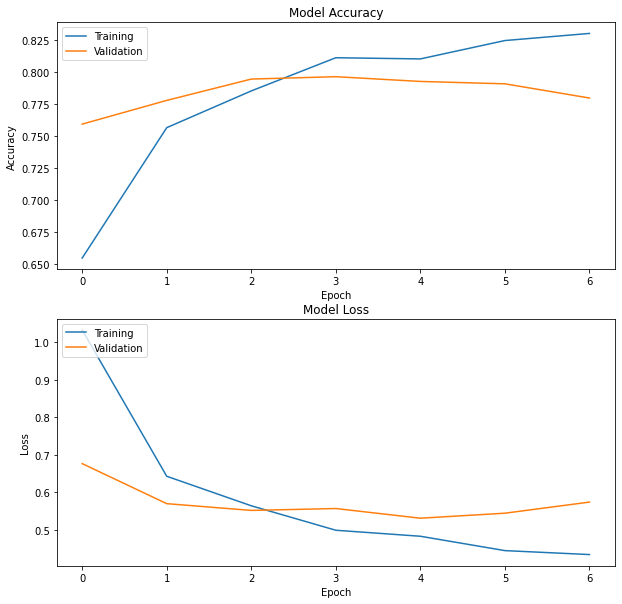

In [ ]:
fig, ([ax0, ax1]) = plt.subplots(nrows=2, 
                                ncols=1,
                                figsize=(10,10))

# Add data to ax0
ax0.plot(out.history["accuracy"])
ax0.plot(out.history["val_accuracy"])
# Change the y axis limits
#ax2.set_ylim([0.6, 0.9])
# Customize ax0
ax0.set(title="Model Accuracy",
        xlabel="Epoch",
        ylabel="Accuracy");
# Add a legend to ax0
ax0.legend(["Training", "Validation"], loc="upper left");

# Add data to ax1
ax1.plot(out.history["loss"])
ax1.plot(out.history["val_loss"])
# Change the y axis limits
#ax1.set_ylim([0.6, 0.9])
# Customize ax0
ax1.set(title="Model Loss",
        xlabel="Epoch",
        ylabel="Loss");
# Add a legend to ax0
ax1.legend(["Training", "Validation"], loc="upper left");

### TensorBoard

In [ ]:
%tensorboard --logdir "drive/My Drive/CBPF/Deep Learning/Tarefa 4/logs"

<IPython.core.display.Javascript object>

## Saving the Trained Model

In [ ]:
def save_model(model, suffix=None):
  """
  Saves a given model in a models directory and appends a suffix (string).
  """
  # Create a model directory pathname with current time
  modeldir = os.path.join("drive/My Drive/CBPF/Deep Learning/Tarefa 4/models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + "-" + suffix + ".h5"  # save format of model
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path

In [ ]:
save_model(model, suffix="1000-images-mobilenetv2-Adam")

Saving model to: drive/My Drive/CBPF/Deep Learning/Tarefa 4/models/20201020-20491603226983-1000-images-mobilenetv2-Adam.h5...


'drive/My Drive/CBPF/Deep Learning/Tarefa 4/models/20201020-20491603226983-1000-images-mobilenetv2-Adam.h5'

# Making Predictions

In [ ]:
# Create test data batch
# valid_data is True so the function can handle y_test
test_data = create_data_batches(X=X_test, test_data=True)
test_data

Creating test data batches...


<BatchDataset shapes: (None, 224, 224, 3), types: tf.float32>

In [ ]:
#saved_model = tf.keras.models.load_model("/content/drive/My Drive/CBPF/Deep Learning/Tarefa 4/models/20201020-20491603226983-1000-images-mobilenetv2-Adam.h5",
#                                   custom_objects={"KerasLayer":hub.KerasLayer})

#test_predictions = saved_model.predict(test_data, verbose=1)
test_predictions = model.predict(test_data, verbose=1)

10/10 [==============================] - 219s 22s/step


In [ ]:
#np.savetxt("/content/drive/My Drive/CBPF/Deep Learning/Tarefa 4/1000-preds_array.csv", test_predictions, delimiter=",")

#predictions = np.genfromtxt("/content/drive/My Drive/CBPF/Deep Learning/Tarefa 4/preds_array.csv", delimiter=",")

# Evaluation

In [ ]:
from scipy import interp
from itertools import cycle
from sklearn.metrics import roc_curve, auc

# Plot linewidth.
lw = 2

# Compute ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(3):
  fpr[i], tpr[i], _ = roc_curve(y_test[:, i], test_predictions[:, i])
  roc_auc[i] = auc(fpr[i], tpr[i])

In [ ]:
# Compute micro-average ROC curve and ROC area
fpr["micro"], tpr["micro"], _ = roc_curve(y_test.ravel(), test_predictions.ravel())
roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])

In [ ]:
# Compute macro-average ROC curve and ROC area

# First aggregate all false positive rates
all_fpr = np.unique(np.concatenate([fpr[i] for i in range(3)]))

# Then interpolate all ROC curves at this points
mean_tpr = np.zeros_like(all_fpr)
for i in range(3):
    mean_tpr += interp(all_fpr, fpr[i], tpr[i])

# Finally average it and compute AUC
mean_tpr /= 3

fpr["macro"] = all_fpr
tpr["macro"] = mean_tpr
roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:9: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead
  if __name__ == '__main__':


### 500 each category

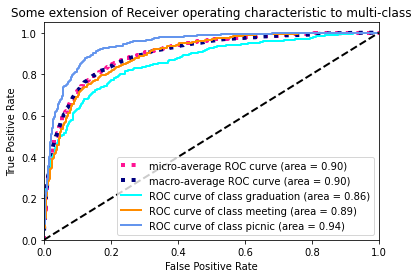

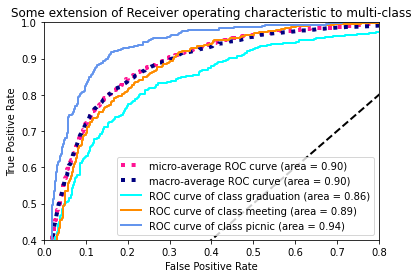

In [ ]:
# Plot all ROC curves
plt.figure(1)
plt.plot(fpr["micro"], tpr["micro"],
         label='micro-average ROC curve (area = {0:0.2f})'
               ''.format(roc_auc["micro"]),
         color='deeppink', linestyle=':', linewidth=4)

plt.plot(fpr["macro"], tpr["macro"],
         label='macro-average ROC curve (area = {0:0.2f})'
               ''.format(roc_auc["macro"]),
         color='navy', linestyle=':', linewidth=4)

colors = cycle(['aqua', 'darkorange', 'cornflowerblue'])
for i, color in zip(range(3), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=lw,
             label='ROC curve of class {0} (area = {1:0.2f})'
             ''.format(unique_categories[i], roc_auc[i]))

plt.plot([0, 1], [0, 1], 'k--', lw=lw)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Some extension of Receiver operating characteristic to multi-class')
plt.legend(loc="lower right")
plt.show()


# Zoom in view of the upper left corner.
plt.figure(2)
plt.xlim(0, 0.8)
plt.ylim(0.4, 1)
plt.plot(fpr["micro"], tpr["micro"],
         label='micro-average ROC curve (area = {0:0.2f})'
               ''.format(roc_auc["micro"]),
         color='deeppink', linestyle=':', linewidth=4)

plt.plot(fpr["macro"], tpr["macro"],
         label='macro-average ROC curve (area = {0:0.2f})'
               ''.format(roc_auc["macro"]),
         color='navy', linestyle=':', linewidth=4)

colors = cycle(['aqua', 'darkorange', 'cornflowerblue'])
for i, color in zip(range(3), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=lw,
             label='ROC curve of class {0} (area = {1:0.2f})'
             ''.format(unique_categories[i], roc_auc[i]))

plt.plot([0, 1], [0, 1], 'k--', lw=lw)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Some extension of Receiver operating characteristic to multi-class')
plt.legend(loc="lower right")
plt.show()

### 1000 each category

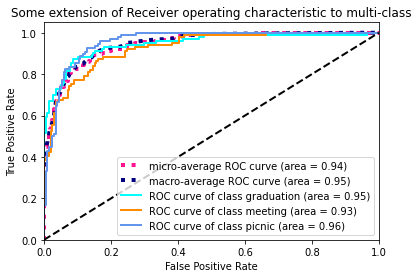

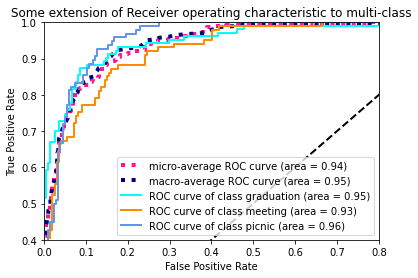

In [ ]:
# Plot all ROC curves
plt.figure(1)
plt.plot(fpr["micro"], tpr["micro"],
         label='micro-average ROC curve (area = {0:0.2f})'
               ''.format(roc_auc["micro"]),
         color='deeppink', linestyle=':', linewidth=4)

plt.plot(fpr["macro"], tpr["macro"],
         label='macro-average ROC curve (area = {0:0.2f})'
               ''.format(roc_auc["macro"]),
         color='navy', linestyle=':', linewidth=4)

colors = cycle(['aqua', 'darkorange', 'cornflowerblue'])
for i, color in zip(range(3), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=lw,
             label='ROC curve of class {0} (area = {1:0.2f})'
             ''.format(unique_categories[i], roc_auc[i]))

plt.plot([0, 1], [0, 1], 'k--', lw=lw)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Some extension of Receiver operating characteristic to multi-class')
plt.legend(loc="lower right")
plt.show()


# Zoom in view of the upper left corner.
plt.figure(2)
plt.xlim(0, 0.8)
plt.ylim(0.4, 1)
plt.plot(fpr["micro"], tpr["micro"],
         label='micro-average ROC curve (area = {0:0.2f})'
               ''.format(roc_auc["micro"]),
         color='deeppink', linestyle=':', linewidth=4)

plt.plot(fpr["macro"], tpr["macro"],
         label='macro-average ROC curve (area = {0:0.2f})'
               ''.format(roc_auc["macro"]),
         color='navy', linestyle=':', linewidth=4)

colors = cycle(['aqua', 'darkorange', 'cornflowerblue'])
for i, color in zip(range(3), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=lw,
             label='ROC curve of class {0} (area = {1:0.2f})'
             ''.format(unique_categories[i], roc_auc[i]))

plt.plot([0, 1], [0, 1], 'k--', lw=lw)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Some extension of Receiver operating characteristic to multi-class')
plt.legend(loc="lower right")
plt.show()

# K-Fold Cross Validation

In [ ]:
from sklearn.model_selection import KFold, StratifiedKFold

kf = KFold(n_splits = 10, shuffle=True, random_state=1)

In [ ]:
def get_model_name(k):
    return 'model_'+str(k)+'.h5'

In [ ]:
# Define per-fold score containers <-- these are new
acc_per_fold = []
loss_per_fold = []

save_dir = '/content/drive/My Drive/CBPF/Deep Learning/Tarefa 4/models/'
fold_no = 1

# Merge inputs and targets
inputs = np.concatenate((X_train, X_val), axis=0)
targets = np.concatenate((y_train, y_val), axis=0)

for train, val in kf.split(inputs, targets):

  train_data = create_data_batches(inputs[train], targets[train])
  val_data = create_data_batches(inputs[val], targets[val], valid_data=True)
  
  # Build the model
  model = create_model()

  # Generate a print
  print('------------------------------------------------------------------------')
  print(f'Training for fold {fold_no} ...')

  # CREATE CALLBACKS
  checkpoint = tf.keras.callbacks.ModelCheckpoint(save_dir+get_model_name(fold_no),
                                                  monitor='val_accuracy', verbose=1, 
                                                  save_best_only=True, mode='max')

  model.fit(x=train_data,
            epochs=10, 
            validation_data=val_data,
            validation_freq=1,
            callbacks=[checkpoint])

  # Generate generalization metrics
  scores = model.evaluate(val_data, verbose=0)
  print(f'Score for fold {fold_no}: {model.metrics_names[0]} of {scores[0]}; {model.metrics_names[1]} of {scores[1]*100}%')
  acc_per_fold.append(scores[1] * 100)
  loss_per_fold.append(scores[0])

  # Increase fold number
  fold_no = fold_no + 1

Creating training data batches...
Creating validation data batches...
Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
------------------------------------------------------------------------
Training for fold 1 ...
Epoch 1/10
76/76 [==============================] - ETA: 0s - loss: 0.9701 - accuracy: 0.6720
Epoch 00001: val_accuracy improved from -inf to 0.78148, saving model to /content/drive/My Drive/CBPF/Deep Learning/Tarefa 4/models/model_1.h5
76/76 [==============================] - 13s 172ms/step - loss: 0.9701 - accuracy: 0.6720 - val_loss: 0.6251 - val_accuracy: 0.7815
Epoch 2/10
76/76 [==============================] - ETA: 0s - loss: 0.6449 - accuracy: 0.7609
Epoch 00002: val_accuracy improved from 0.78148 to 0.80000, saving model to /content/drive/My Drive/CBPF/Deep Learning/Tarefa 4/models/model_1.h5
76/76 [==============================] - 10s 130ms/step - loss: 0.6449 - accuracy: 0.7609 - val_loss: 0.5748 - val_accuracy: 0.8000

In [ ]:
acc_per_fold

In [ ]:
loss_per_fold

In [ ]:
print("Mean:%.2f, std:%.2f" % (np.mean(acc_per_fold), np.std(acc_per_fold)))

Mean:78.81, std:2.17


## Evaluation of K-f CV

In [ ]:
np.mean(evaluation_scores)
for i in evaluation_scores

[0.5514720678329468, 0.7833333611488342]

### ROC - AUC 

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:26: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead


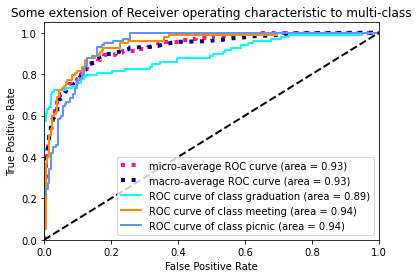

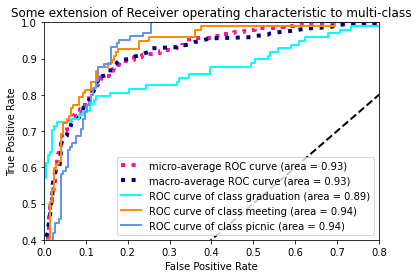

In [ ]:
from scipy import interp
from itertools import cycle
from sklearn.metrics import roc_curve, auc

# Plot linewidth.
lw = 2

# Compute ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(3):
  fpr[i], tpr[i], _ = roc_curve(y_test[:, i], kfold_test_predictions[0][:, i])
  roc_auc[i] = auc(fpr[i], tpr[i])

# Compute micro-average ROC curve and ROC area
fpr["micro"], tpr["micro"], _ = roc_curve(y_test.ravel(), kfold_test_predictions[0].ravel())
roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])

# Compute macro-average ROC curve and ROC area
# First aggregate all false positive rates
all_fpr = np.unique(np.concatenate([fpr[i] for i in range(3)]))
# Then interpolate all ROC curves at this points
mean_tpr = np.zeros_like(all_fpr)
for i in range(3):
    mean_tpr += interp(all_fpr, fpr[i], tpr[i])
# Finally average it and compute AUC
mean_tpr /= 3
fpr["macro"] = all_fpr
tpr["macro"] = mean_tpr
roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])

# Plot all ROC curves
plt.figure(1)
plt.plot(fpr["micro"], tpr["micro"],
         label='micro-average ROC curve (area = {0:0.2f})'
               ''.format(roc_auc["micro"]),
         color='deeppink', linestyle=':', linewidth=4)

plt.plot(fpr["macro"], tpr["macro"],
         label='macro-average ROC curve (area = {0:0.2f})'
               ''.format(roc_auc["macro"]),
         color='navy', linestyle=':', linewidth=4)

colors = cycle(['aqua', 'darkorange', 'cornflowerblue'])
for i, color in zip(range(3), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=lw,
             label='ROC curve of class {0} (area = {1:0.2f})'
             ''.format(unique_categories[i], roc_auc[i]))

plt.plot([0, 1], [0, 1], 'k--', lw=lw)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Some extension of Receiver operating characteristic to multi-class')
plt.legend(loc="lower right")
plt.show()


# Zoom in view of the upper left corner.
plt.figure(2)
plt.xlim(0, 0.8)
plt.ylim(0.4, 1)
plt.plot(fpr["micro"], tpr["micro"],
         label='micro-average ROC curve (area = {0:0.2f})'
               ''.format(roc_auc["micro"]),
         color='deeppink', linestyle=':', linewidth=4)

plt.plot(fpr["macro"], tpr["macro"],
         label='macro-average ROC curve (area = {0:0.2f})'
               ''.format(roc_auc["macro"]),
         color='navy', linestyle=':', linewidth=4)

colors = cycle(['aqua', 'darkorange', 'cornflowerblue'])
for i, color in zip(range(3), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=lw,
             label='ROC curve of class {0} (area = {1:0.2f})'
             ''.format(unique_categories[i], roc_auc[i]))

plt.plot([0, 1], [0, 1], 'k--', lw=lw)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Some extension of Receiver operating characteristic to multi-class')
plt.legend(loc="lower right")
plt.show()